#

# Intro 

This is an End-to-End project on [Online Retail Data Set](https://www.kaggle.com/datasets/carrie1/ecommerce-data). This is a Part One, in which I'll do some EDA and later divide customers in segments (clusters) using different clustering algorithms. in Part Two, RFM Analysis of the same dataset will be performed. The dataset contains all the transactions occurring between 01/12/2010 and 09/12/2011 for a UK-based and registered non-store online retail. The company mainly sells unique all-occasion gifts. Many customers of the company are wholesalers. In the end, a Web App will be deployed using these two notebooks. The stages here are the following:
* Data Preparation
* Exploratory Data Analysis
* Feature Engineering 
* Clustering Of Products And Customers
* Classification Of Customers
* Evaluate Tuned Model On Test Set
* Interpret Results

But first, let's import libraries and data.

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
plt.style.use('fivethirtyeight')
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

In [2]:
# NOTE: default encoding='utf-8' gives an error, so another method is used
df=pd.read_csv('../data/data.csv', encoding="ISO-8859-1")
df.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,12/1/2010 8:26,2.55,17850.0,United Kingdom
1,536365,71053,WHITE METAL LANTERN,6,12/1/2010 8:26,3.39,17850.0,United Kingdom
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,12/1/2010 8:26,2.75,17850.0,United Kingdom
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,12/1/2010 8:26,3.39,17850.0,United Kingdom
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,12/1/2010 8:26,3.39,17850.0,United Kingdom


# Data Preparation

In first section, let's take a first look at the data: its dimensions, datatypes, missing values, etc.

In [3]:
df.shape

(541909, 8)

Here we have 8 columns and more than half a million rows (transactions), Hence, it's a long data, a relatively big dataset. Now, what about datatype and no. of nulls of each column?

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 541909 entries, 0 to 541908
Data columns (total 8 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   InvoiceNo    541909 non-null  object 
 1   StockCode    541909 non-null  object 
 2   Description  540455 non-null  object 
 3   Quantity     541909 non-null  int64  
 4   InvoiceDate  541909 non-null  object 
 5   UnitPrice    541909 non-null  float64
 6   CustomerID   406829 non-null  float64
 7   Country      541909 non-null  object 
dtypes: float64(2), int64(1), object(5)
memory usage: 33.1+ MB


Surprisingly, there are not so much nulls in the data (Often in real-world datasets we have to deal with lots of null values using different tactics: impute mean/median, drop rows/columns with nulls, etc). Only `CustomerID` has nulls. As for datatypes, they also look okay. Maybe `InvoiceDate` type could be changed from `object` to `datetime`. Let's look at percentage of nulls in `CustomerID` from all rows.

In [5]:
df['CustomerID'].isna().sum()/df.shape[0]

0.249266943342886

Almost 25%. What to do with nulls depends on many things (data, column, your end goal, etc). Here, as mean/median imputimg would not be reasonable, I'll just drop values with nulls.

In [6]:
df.dropna(subset=['CustomerID'], inplace=True)

In [7]:
df.shape

(406829, 8)

In [8]:
df.isna().sum()

InvoiceNo      0
StockCode      0
Description    0
Quantity       0
InvoiceDate    0
UnitPrice      0
CustomerID     0
Country        0
dtype: int64

Now, as there are no nulls in the data, it's time to perform some EDA.

# Exploratory Data Analysis

First of all, let's list all columns with their definitions.
\
**InvoiceNo**: Invoice number. Nominal, a 6-digit integral number uniquely assigned to each transaction. If this code starts with letter 'c', it indicates a cancellation.  <br>
**StockCode**: Product (item) code. Nominal, a 5-digit integral number uniquely assigned to each distinct product. <br>
**Description**: Product (item) name. Nominal. <br>
**Quantity**: The quantities of each product (item) per transaction. Numeric.	<br>
**InvoiceDate**: Invice Date and time. Numeric, the day and time when each transaction was generated. <br>
**UnitPrice**: Unit price. Numeric, Product price per unit in sterling. <br>
**CustomerID**: Customer number. Nominal, a 5-digit integral number uniquely assigned to each customer. <br>
**Country**: Country name. Nominal, the name of the country where each customer resides.
\
Now let's examine some statistics.

In [9]:
df.describe()[['Quantity','UnitPrice']]

,Quantity,UnitPrice
count,406829.000000,406829.000000
mean,12.061303,3.460471
std,248.693370,69.315162
min,-80995.000000,0.000000
25%,2.000000,1.250000
50%,5.000000,1.950000
75%,12.000000,3.750000
max,80995.000000,38970.000000


Minimum Quantity is -80995, which is negative. Clearly there's something wrong. Let's examine further.

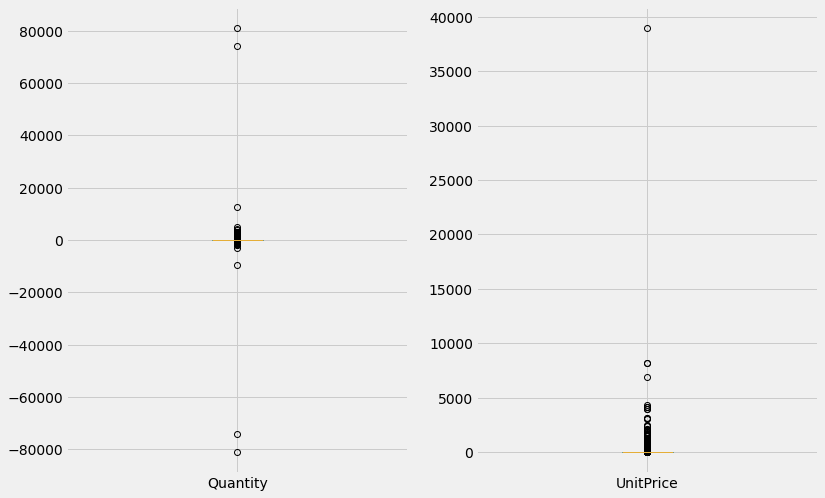

In [10]:
plt.figure(figsize=(12,8))

plt.subplot(121)
df['Quantity'].plot(kind='box');

plt.subplot(122)
df['UnitPrice'].plot(kind='box');

There are only several extreme (both very large and little) outliers in both Quantity and UnitPrice. Let's see how much outliers are there exactly and later remove them. The [extreme outlier definition](https://people.richland.edu/james/lecture/m170/ch03-pos.html) is used here.

In [11]:
def find_outliers(data, column, coef):
    q1, q3=data[column].describe()[['25%', '75%']]
    iqr=q3-q1
    outliers=data[(data[column]<=(q1-coef*iqr)) | (data[column]>=(q3+coef*iqr))]
    print(f'There are {outliers.shape[0]} ({outliers.shape[0]/data.shape[0]*100:.2f}%) outliers out of {df.shape[0]} rows')
    return outliers

out_quantity=find_outliers(df, 'Quantity', 3)
out_price=find_outliers(df, 'UnitPrice', 3)

There are 19118 (4.70%) outliers out of 406829 rows
There are 10335 (2.54%) outliers out of 406829 rows


Less than 5% of extreme outliers in `Quantity` and 2.5% in `UnitPrice`, hence there should be no problems in droping them.

In [12]:
out_quantity_idx, out_price_idx=set(out_quantity.index), set(out_price.index)
all_outliers_idx=out_quantity_idx | out_price_idx
f'All outliers: {len(all_outliers_idx)} ({len(all_outliers_idx)/df.shape[0]*100:.2f}%)'

'All outliers: 29438 (7.24%)'

In [13]:
df.drop(all_outliers_idx, inplace=True)
df.shape

(377391, 8)

Now that outliers are removed, let's plot boxplot again adn see the difference.

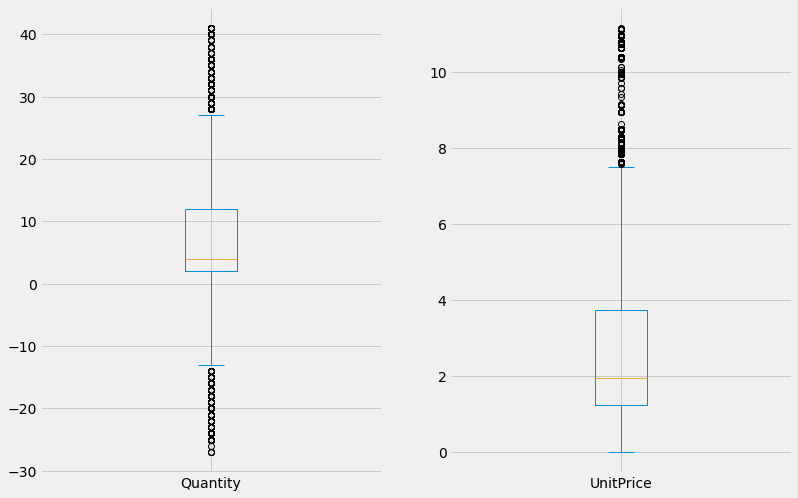

In [14]:
plt.figure(figsize=(12,8))

plt.subplot(121)
df['Quantity'].plot(kind='box');

plt.subplot(122)
df['UnitPrice'].plot(kind='box');

There are around 380000 transactions (not unique) in the dataset. Let's see how many unique products, transactions and customers are there. 

In [15]:
print(f'No. of Products: {len(df["StockCode"].value_counts())}')
print(f'No. of Transactions: {len(df["InvoiceNo"].value_counts())}')
print(f'No. of Customers: {len(df["CustomerID"].value_counts())}')

No. of Products: 3594
No. of Transactions: 20405
No. of Customers: 4261


Let's now see how many products were purchased in each transaction.

In [16]:
df_by_tr=df.groupby(['CustomerID', 'InvoiceNo'], as_index=False)['InvoiceDate'].count().rename(columns={'InvoiceDate':'Prod. Count'})
df_by_tr.sort_values('CustomerID')[:10]

,CustomerID,InvoiceNo,Prod. Count
0,12347.0,537626,31
1,12347.0,542237,28
2,12347.0,549222,22
3,12347.0,556201,18
4,12347.0,562032,21
5,12347.0,573511,45
6,12347.0,581180,11
7,12348.0,539318,4
8,12348.0,541998,1
9,12348.0,548955,1


There are some Invoice numbers that have 'C'. It means that this order was cancelled.

In [17]:
df_by_tr[df_by_tr['InvoiceNo'].apply(lambda x: 'C' in x)]

,CustomerID,InvoiceNo,Prod. Count
19,12352.0,C547388,7
33,12359.0,C549955,1
34,12359.0,C580165,2
49,12362.0,C544902,2
50,12362.0,C563752,3
...,...,...,...
20370,18272.0,C552720,4
20375,18274.0,C577832,10
20377,18276.0,C577386,1
20378,18276.0,C577390,1


These cancelled orders should be removed. it can be easily done using C flag from `InvoiceNo`. Let's find indices of cancelled orders and see how many % of total orders they make up.

In [18]:
cancelled_idx=df[df['InvoiceNo'].apply(lambda x: 'C' in x)].index
(cancelled_idx.shape[0]/df.shape[0])*100

2.025485504423794

Only 2 percent. So these orders can be dropped.

In [19]:
df.drop(cancelled_idx, inplace=True)
df.shape

(369747, 8)

Now it's time to use some plots to analyze the data.

In [20]:
import plotly.graph_objs as go
from plotly.offline import iplot

countries=df['Country'].value_counts()

map_data=dict(type='choropleth',
                locations=countries.index,
                locationmode='country names', 
                z=countries,
                colorbar={'title':'Orders'},
                colorscale=[[0, 'rgb(214,255,255)'],
                    [0.01, 'rgb(166,206,227)'], [0.02, 'rgb(31,120,180)'],
                    [0.03, 'rgb(178,223,138)'], [0.05, 'rgb(51,160,44)'],
                    [0.10, 'rgb(251,154,153)'], [0.20, 'rgb(255,255,0)'],
                    [1, 'rgb(227,26,28)']], reversescale=False)

layout=dict(title={'text': "Number of Orders by Countries",
                'y':0.9,
                'x':0.5},
            geo=dict(showocean=True, 
                oceancolor="LightBlue"),
            height=600,
            width=1000)

choromap=go.Figure(data=map_data, layout=layout)
choromap.show()


As the data comes from UK-based store, it's no surprise that vast majority of orders are from the UK itself.

In [21]:
import plotly.express as px

plt.figure(figsize=(10, 6))

fig=px.histogram(df, x="UnitPrice", nbins=20,
                    labels={
                    "UnitPrice": "Price "},
                    title="Price Distribution",
                    color_discrete_sequence=['darkred']).update_layout(yaxis_title="Price")

fig.update_traces(marker_line_width=1,marker_line_color="white")

fig.update_layout(
    margin=dict(l=20, r=40, t=40, b=20),
)
fig.show();

<Figure size 720x432 with 0 Axes>

People tend to buy pretty cheap (0.5-2.5 dollars) items. What about Quantities? Maybe it's common to buy cheap things, but in bulk?

In [22]:
plt.figure(figsize=(10, 6))

fig=px.histogram(df, x="Quantity", nbins=20,
                    labels={
                    "Quantity": "Quantity "},
                    title="Quantity Distribution",
                    color_discrete_sequence=['darkblue']).update_layout(yaxis_title="Price")

fig.update_traces(marker_line_width=1,marker_line_color="white")

fig.update_layout(
    margin=dict(l=20, r=40, t=40, b=20),
)
fig.show();

<Figure size 720x432 with 0 Axes>

No, people just buy 1-4 cheap items in most cases, that's all.

In [23]:
df.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,12/1/2010 8:26,2.55,17850.0,United Kingdom
1,536365,71053,WHITE METAL LANTERN,6,12/1/2010 8:26,3.39,17850.0,United Kingdom
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,12/1/2010 8:26,2.75,17850.0,United Kingdom
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,12/1/2010 8:26,3.39,17850.0,United Kingdom
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,12/1/2010 8:26,3.39,17850.0,United Kingdom


Finally let's also explore `Description`, maybe it's possible to find some interesting insights here too.

In [24]:
items=pd.DataFrame(df['Description'].value_counts()).reset_index()
items.rename(columns={'index':'Item', 'Description':'No. of Orders'}, inplace=True)
items.head(10)

,Item,No. of Orders
0,WHITE HANGING HEART T-LIGHT HOLDER,1921
1,JUMBO BAG RED RETROSPOT,1392
2,ASSORTED COLOUR BIRD ORNAMENT,1297
3,PARTY BUNTING,1281
4,LUNCH BAG RED RETROSPOT,1246
5,SET OF 3 CAKE TINS PANTRY DESIGN,1138
6,LUNCH BAG BLACK SKULL.,1070
7,LUNCH BAG SPACEBOY DESIGN,984
8,SPOTTY BUNTING,980
9,PAPER CHAIN KIT 50'S CHRISTMAS,976


In [25]:
fig=px.bar(items.head(10), x='Item', y='No. of Orders',
            color='No. of Orders',
            title='Most Popular Items',
            height=800,
            width=1000)
fig.update_xaxes(showticklabels=False)
fig.show()

The bar chart above shows the most popular items in the store. No surprises there.

# Feature Engineering

Now it's time for probably most important (yet not so exiting per se) part of any ML project-Feature Engineering. Adding new features and transforming old ones will (hopefully) help ML model in learning, so it can make better predictions. Firstly, let's just take a look at the data before any transformations.

In [26]:
df.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,12/1/2010 8:26,2.55,17850.0,United Kingdom
1,536365,71053,WHITE METAL LANTERN,6,12/1/2010 8:26,3.39,17850.0,United Kingdom
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,12/1/2010 8:26,2.75,17850.0,United Kingdom
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,12/1/2010 8:26,3.39,17850.0,United Kingdom
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,12/1/2010 8:26,3.39,17850.0,United Kingdom


Now, the easiest part one can add to this dataset\-total price.

In [27]:
df_new=df.copy()

In [28]:
df_new['TotalPrice']=df_new['UnitPrice']*df_new['Quantity']
df_new.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,TotalPrice
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,12/1/2010 8:26,2.55,17850.0,United Kingdom,15.30
1,536365,71053,WHITE METAL LANTERN,6,12/1/2010 8:26,3.39,17850.0,United Kingdom,20.34
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,12/1/2010 8:26,2.75,17850.0,United Kingdom,22.00
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,12/1/2010 8:26,3.39,17850.0,United Kingdom,20.34
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,12/1/2010 8:26,3.39,17850.0,United Kingdom,20.34


In given dataset, a single order is actually split between different products. So in order to get a full product basket for every order, some aggregations must be done. First, let's convert `InvoiceDate` to datetime format.

In [29]:
df_new['InvoiceDate']=pd.to_datetime(df_new['InvoiceDate'])

In [30]:
price_basket=df_new.groupby(['CustomerID', 'InvoiceNo'], as_index=False)['TotalPrice'].agg('sum')
price_basket.rename(columns={'TotalPrice': 'BasketPrice'}, inplace=True)

time_mean=df_new.groupby(['CustomerID', 'InvoiceNo'], as_index=False)['InvoiceDate'].agg('mean')
price_basket['InvoiceDate_mean']=time_mean['InvoiceDate']

price_basket=price_basket[price_basket['BasketPrice']>0]
price_basket.head(10)

,CustomerID,InvoiceNo,BasketPrice,InvoiceDate_mean
0,12347.0,537626,711.79,2010-12-07 14:57:00
1,12347.0,542237,437.14,2011-01-26 14:30:00
2,12347.0,549222,348.40,2011-04-07 10:43:00
3,12347.0,556201,382.52,2011-06-09 13:01:00
4,12347.0,562032,546.66,2011-08-02 08:48:00
5,12347.0,573511,1131.90,2011-10-31 12:25:00
6,12347.0,581180,224.82,2011-12-07 15:52:00
7,12348.0,539318,52.80,2010-12-16 19:09:00
8,12348.0,541998,20.40,2011-01-25 10:42:00
9,12348.0,548955,17.00,2011-04-05 10:47:00


Now let's divide these values into buckets/bins.

In [31]:
bins=[0, 50, 100, 200, 500, 1000, 5000, 50000]

df_cats=pd.DataFrame(pd.cut(price_basket['BasketPrice'], bins).value_counts()).reset_index()
df_cats.rename(columns={'index': 'PriceRange'}, inplace=True)
df_cats['PriceRange']=df_cats['PriceRange'].apply(lambda x: str(x).split(',')[0][1:]+'-'+str(x).split(',')[1][1:-1])
df_cats

,PriceRange,BasketPrice
0,200-500,7458
1,100-200,4310
2,500-1000,2045
3,50-100,1523
4,0-50,1457
5,1000-5000,487
6,5000-50000,7


Here a bit complicated function for extracting keywords from `Description` will be defined. It'll be very useful later. Some NLP will be used here, but nothing too complex.

In [32]:
import nltk

is_noun=lambda x: x[:2]=='NN'

def keyword_extractor(data, column='Description'):
    stemmer=nltk.stem.SnowballStemmer("english")
    keywords_roots =dict() 
    keywords_select=dict() 
    category_keys  =[]
    count_keywords =dict()
    icount=0
    for s in data[column]:
        if pd.isnull(s): continue
        lines=s.lower()
        tokenized=nltk.word_tokenize(lines)
        nouns=[word for (word, pos) in nltk.pos_tag(tokenized) if is_noun(pos)] 
        
        for t in nouns:
            t=t.lower() ; racine=stemmer.stem(t)
            if racine in keywords_roots:                
                keywords_roots[racine].add(t)
                count_keywords[racine] += 1                
            else:
                keywords_roots[racine]={t}
                count_keywords[racine]=1
    
    for s in keywords_roots.keys():
        if len(keywords_roots[s]) > 1:  
            min_length=1000
            for k in keywords_roots[s]:
                if len(k) < min_length:
                    clef=k ; min_length=len(k)            
            category_keys.append(clef)
            keywords_select[s]=clef
        else:
            category_keys.append(list(keywords_roots[s])[0])
            keywords_select[s]=list(keywords_roots[s])[0]
                   
    print("Nb of keywords in variable '{}': {}".format(column,len(category_keys)))
    return category_keys, keywords_roots, keywords_select, count_keywords

The function above does the following:

* Iterates through all values (sentence) in the given column and extracts list of nouns from each value.
* Iterates through list of nouns for each sentence and stems each noun to get a root. Then keep words associated with each root in a separate set.
* Counts how many times each root appears in given data.
* Iterates through all sets with root-associated words. If the set has more than 1 word, go through this set and get the shortest word. Hence, each root is associated with the shortest word in its set.

In [33]:
# nltk.download()

In [34]:
df_products=pd.DataFrame(df['Description'].unique()).rename(columns={0:'Description'})
df_products.head()

,Description
0,WHITE HANGING HEART T-LIGHT HOLDER
1,WHITE METAL LANTERN
2,CREAM CUPID HEARTS COAT HANGER
3,KNITTED UNION FLAG HOT WATER BOTTLE
4,RED WOOLLY HOTTIE WHITE HEART.


In [35]:
keywords, keywords_roots, keywords_select, count_keywords=keyword_extractor(df_products)

Nb of keywords in variable 'Description': 1450


This function returns four variables:
* `keywords`: the list of extracted keywords
* `keywords_roots`: a dictionary where the keys are the keywords roots and the values are the lists of words associated with those roots
* `keywords_select`: the shortest word selected from lists of words associated with each root
* `count_keywords`: dictionary listing the number of times every word is used

There are some words that are useless (e.g., colors). Let's clean up a bit.

In [36]:
list_products={}
for k,v in count_keywords.items():
    word=keywords_select[k]
    if word in ['pink', 'blue', 'tag', 'green', 'orange']: 
        continue
    if len(word) < 3 or v < 13: 
        continue
    if ('+' in word) or ('/' in word): 
        continue
    list_products[keywords_select[k]]=v
list_products={k: [v] for k, v in sorted(list_products.items(), key=lambda item: item[1], reverse=True)}
len(list_products)

185

In [50]:
pd.DataFrame(list_products).to_csv('../data/list_prod_list.csv', index=False) # I'll need this for later use in web app

Now let's plot most common words in description and see what insights can be extracted from it.

In [37]:
list_products_df=pd.DataFrame(list_products).T.reset_index()
list_products_df.rename(columns={'index': 'Word', 0: 'Count'}, inplace=True)
list_products_df.head()

,Word,Count
0,heart,263
1,vintage,198
2,set,195
3,bag,158
4,box,150


In [38]:
fig=px.bar(list_products_df.head(20), y='Word', x='Count',
            orientation='h',
            title='Most Common Words',
            height=1000,
            width=800)

fig.update_layout(yaxis=dict(autorange="reversed"))
fig.update_traces(marker_color='purple')

fig.show()

Now let's use these words to create product groups. A matrix of one-hot-encoding vectors will be created, with products on y axis and words on x axis.

In [39]:
prod_description=df_new['Description'].unique()

X=pd.DataFrame()
for key, occurence in list_products.items():
    X[key]=list(map(lambda x:int(key.upper() in x), prod_description))

In [40]:
X.head(10)

,heart,vintage,set,bag,box,glass,christmas,design,candle,holder,...,toadstool,piece,milk,house,square,girl,lace,plant,wallet,point
0,1,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,1,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,1,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


It's a pretty sparse matrix. It's also possible to add 6 extra columns to this matrix to indicate the price range of the products.

In [41]:
threshold=[0, 1, 2, 3, 5, 10]
label_col=[]

for i in range(len(threshold)):
    if i==len(threshold)-1:
        col=f'{threshold[i]}+'
    else:
        col=f'{threshold[i]}-{threshold[i+1]}'
    label_col.append(col)
    X[col]=0

for i, prod in enumerate(prod_description):
    prix=df_new[df_new['Description']==prod]['UnitPrice'].mean()
    j=0
    while prix>threshold[j]:
        j+=1
        if j==len(threshold):
            break
    X.loc[i, label_col[j-1]]=1

And now let's count how many products there are in each price range.

In [42]:
X.iloc[:, -6:].sum(axis=0)

0-1      950
1-2     1011
2-3      675
3-5      619
5-10     479
10+       40
dtype: int64

# Test Clustering Algorithms

In this part of the project I'll clustering algorithms to segment one-hot-encoded word-product matrix.

Firstly, KMeans will be tested. KMeans is a good clustering algoritm to start. The hyperparameter to tune here is number of clusters. The quality of clusters can be evaluated using [silhouette score](https://scikit-learn.org/stable/auto_examples/cluster/plot_kmeans_silhouette_analysis.html). The score has range between -1 and 1. 
* 1: Means clusters are well apart from each other and clearly distinguished.
* 0: Means clusters are indifferent, or we can say that the distance between clusters is not significant.
* -1: Means clusters are assigned in the wrong way.

## KMeans

For n_clusters=3, The average silhouette score=0.1065860569242036
For n_clusters=4, The average silhouette score=0.13370444496894357
For n_clusters=5, The average silhouette score=0.13383309713636365
For n_clusters=6, The average silhouette score=0.15436557722759955
For n_clusters=7, The average silhouette score=0.159223651008039
For n_clusters=8, The average silhouette score=0.1599070031867514


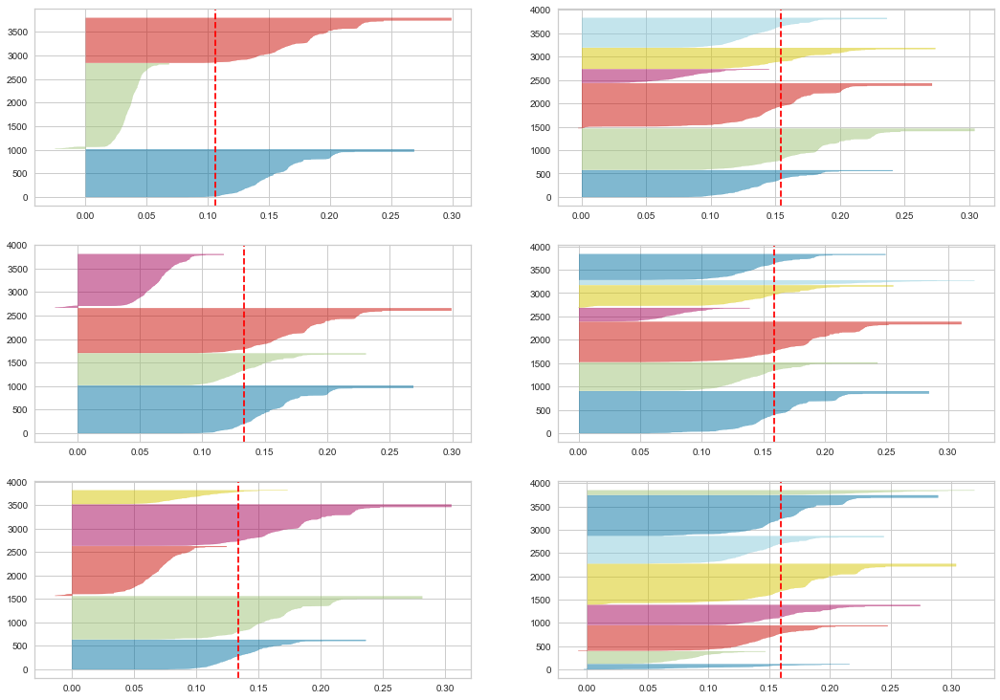

In [52]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score
from yellowbrick.cluster import SilhouetteVisualizer

matrix=X.to_numpy()
fig, ax=plt.subplots(3, 2, figsize=(16,12))
for n_clusters in range(3,9):
    kmeans=KMeans(init='k-means++', n_clusters=n_clusters, n_init=30)
    kmeans.fit(matrix)
    clusters=kmeans.predict(matrix)
    silhouette_avg=silhouette_score(matrix, clusters)
    print(f"For n_clusters={n_clusters}, The average silhouette score={silhouette_avg}")
    
    q, mod=divmod(n_clusters, 3)
    visualizer=SilhouetteVisualizer(kmeans, colors='yellowbrick', ax=ax[mod][q-1])
    visualizer.fit(X)

Silhouette plots shows average silhouette score as well as each cluster's 
'thickness' (number of points inside of it). 5 clusters seems to be an optimal solution. Let's train one more time.

In [53]:
kmeans_product=KMeans(init='k-means++', n_clusters=5, n_init=50)
kmeans_product.fit(matrix)
clusters=kmeans_product.predict(matrix)
silhouette_avg=silhouette_score(matrix, clusters)
silhouette_avg

0.15664659642933104

Now we save this model for later use.

In [46]:
import joblib

joblib.dump(kmeans_product, '../models/kmeans_products.sav')

['../models/kmeans_products.sav']

Now that we have clustered orders, we can see which words are most popular

In [54]:
list_prod_description=pd.DataFrame(prod_description)
list_words=[word for (word, occurence) in list_products.items()]

occurence=[dict() for _ in range(n_clusters)]
n_clusters=5

for i in range(n_clusters):
    list_cluster=list_prod_description.loc[clusters==i]
    for word in list_words:
        occurence[i][word]=sum(list_cluster.loc[:, 0].str.contains(word.upper()))

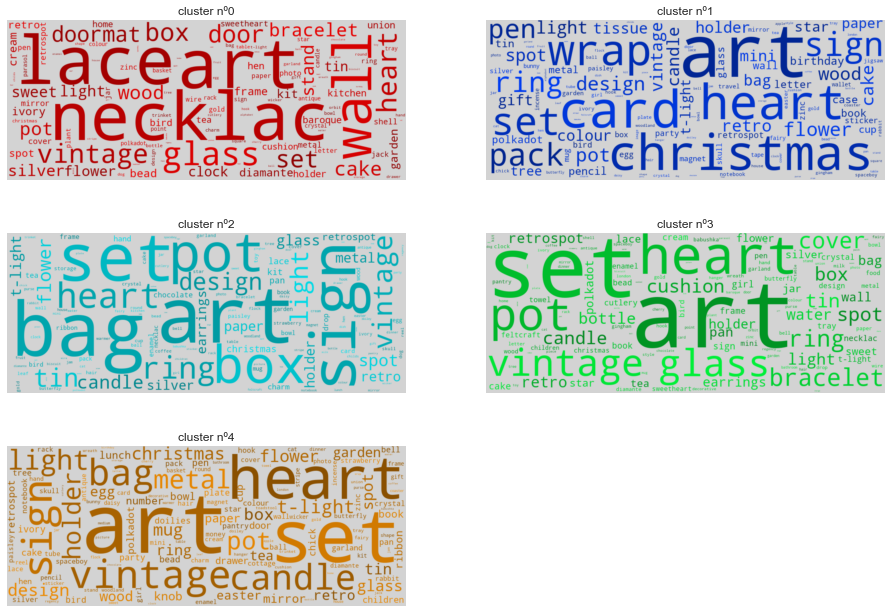

In [55]:
from wordcloud import WordCloud

def random_color_func(word=None, font_size=None, position=None,
                    orientation=None, font_path=None, random_state=None):
    h=int(360.0 * worddd / 255.0)
    s=int(100.0 * 255.0 / 255.0)
    l=int(100.0 * float(random_state.randint(70, 120)) / 255.0)
    return "hsl({}, {}%, {}%)".format(h, s, l)

def make_wordcloud(liste, increment):
    ax1=fig.add_subplot(4,2,increment)
    words=dict()
    trunc_occurences=liste[0:150]
    for s in trunc_occurences:
        words[s[0]]=s[1]

    wordcloud=WordCloud(width=1000,height=400, background_color='lightgrey', 
                        max_words=1628,relative_scaling=1,
                        color_func=random_color_func,
                        normalize_plurals=False)
    wordcloud.generate_from_frequencies(words)
    ax1.imshow(wordcloud, interpolation="bilinear")
    ax1.axis('off')
    plt.title('cluster nº{}'.format(increment-1))

fig=plt.figure(1, figsize=(14,14))
color=[0, 160, 130, 95, 280, 40, 330, 110, 25]
for i in range(n_clusters):
    list_cluster_occurences=occurence[i]

    worddd=color[i] 
    list_occ=[]
    for key, value in list_cluster_occurences.items():
        list_occ.append([key, value])
    list_occ.sort(key=lambda x:x[1], reverse=True)
    make_wordcloud(list_occ, i+1)            

In [79]:
df_new.groupby('categ_product', as_index=False)['Description'].value_counts()

,categ_product,Description,count
0,0,RETROSPOT TEA SET CERAMIC 11 PC,826
1,0,HOME BUILDING BLOCK WORD,708
2,0,DOORMAT KEEP CALM AND COME IN,633
3,0,IVORY KITCHEN SCALES,622
4,0,WOOD BLACK BOARD ANT WHITE FINISH,587
...,...,...,...
3769,4,CLASSIC CROME BICYCLE BELL,1
3770,4,BLUE/YELLOW CERAMIC CANDLE HOLDER,1
3771,4,PURPLE/TURQ FLOWERS HANDBAG,1
3772,4,PURPLE/BLUE CERAMIC CANDLE HOLDER,1


From these workcoulds we can say that clusters are not actually that different. For example, word `art` is common in all 5 clusters.

## PCA

PCA stands for Principal component analysis. It's a very popular dimensionality reduction technique used in ML. Let's use it to reduce dimentiosn in one-hot-encoded matrix X.

In [56]:
from sklearn.decomposition import PCA

pca=PCA()
pca.fit(matrix)
pca_samples=pca.transform(matrix)

And now, for each component, plot explained variance.

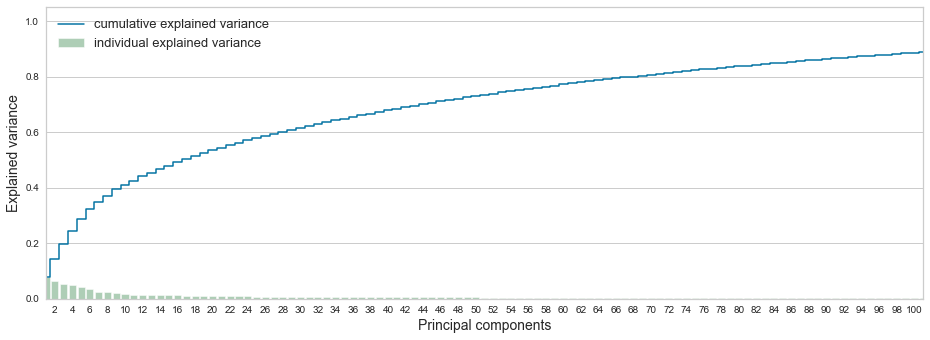

In [57]:
fig, ax=plt.subplots(figsize=(14, 5))
sns.set(font_scale=1)
plt.step(range(matrix.shape[1]), pca.explained_variance_ratio_.cumsum(), where='mid',
        label='cumulative explained variance')
sns.barplot(np.arange(1,matrix.shape[1]+1), pca.explained_variance_ratio_, alpha=0.5, color='g',
            label='individual explained variance')
plt.xlim(0, 100)

ax.set_xticklabels([s if int(s.get_text())%2 == 0 else '' for s in ax.get_xticklabels()])

plt.ylabel('Explained variance', fontsize=14)
plt.xlabel('Principal components', fontsize=14)
plt.legend(loc='upper left', fontsize=13);

100 dimentions are required ot get 90% explained variance. Not bad, but not great either.

## Categorising Customers

Now we can use clusters from previous section for later categorization. 

In [58]:
corresp=dict()
for key, val in zip (prod_description, clusters):
    corresp[key]=val 

df_new['categ_product']=df_new.loc[:, 'Description'].map(corresp)

In [59]:
df_new.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,TotalPrice,categ_product
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850.0,United Kingdom,15.30,2
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,20.34,3
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850.0,United Kingdom,22.00,3
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,20.34,3
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,20.34,3


In [60]:
df_neeew=df_new.copy()

for i in range(n_clusters):
    col=f'categ_{i}'
    df_temp=df_new[df_new['categ_product']==i]
    price_temp=df_temp['TotalPrice']
    price_temp=price_temp.apply(lambda x:x if x > 0 else 0)
    df_neeew[col]=price_temp
    df_neeew[col].fillna(0, inplace=True)

df_neeew.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,TotalPrice,categ_product,categ_0,categ_1,categ_2,categ_3,categ_4
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850.0,United Kingdom,15.30,2,0.0,0.0,15.3,0.00,0.0
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,20.34,3,0.0,0.0,0.0,20.34,0.0
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850.0,United Kingdom,22.00,3,0.0,0.0,0.0,22.00,0.0
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,20.34,3,0.0,0.0,0.0,20.34,0.0
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,20.34,3,0.0,0.0,0.0,20.34,0.0


Now let's aggregate to get one row per invoice.

In [61]:
price_basket_extend=price_basket.copy()

for i in range(5):
    col=f'categ_{i}'
    temp=df_neeew.groupby(by=['CustomerID', 'InvoiceNo'], as_index=False)[col].sum()[col]
    price_basket_extend[col]=temp

price_basket_extend.head()

,CustomerID,InvoiceNo,BasketPrice,InvoiceDate_mean,categ_0,categ_1,categ_2,categ_3,categ_4
0,12347.0,537626,711.79,2010-12-07 14:57:00,124.44,23.40,83.40,293.35,187.2
1,12347.0,542237,437.14,2011-01-26 14:30:00,0.00,84.34,53.10,169.20,130.5
2,12347.0,549222,348.40,2011-04-07 10:43:00,0.00,81.00,71.10,115.00,81.3
3,12347.0,556201,382.52,2011-06-09 13:01:00,19.90,41.40,78.06,168.76,74.4
4,12347.0,562032,546.66,2011-08-02 08:48:00,97.80,61.30,119.70,158.16,109.7


Great! We have division of orders by categories. Now we can divide the data in 2 parts: first 10 months and last 2 months. Hence, later it's possible to create a model that given first dataset can predict person's acctivity during last 2 months.

In [62]:
import datetime

set_entrainement=price_basket_extend[price_basket_extend['InvoiceDate_mean'].dt.date < datetime.date(2011,10,1)]
set_test=price_basket_extend[price_basket_extend['InvoiceDate_mean'].dt.date >= datetime.date(2011,10,1)]
price_basket_extend=set_entrainement.copy(deep=True)

Now I'll get different statistics for each customer.

In [63]:
transactions_per_user=price_basket_extend.groupby(by=['CustomerID'])['BasketPrice'].agg(['count','min','max','mean','sum'])

for i in range(5):
    col=f'categ_{i}'
    transactions_per_user.loc[:,col]=price_basket_extend.groupby(by=['CustomerID'])[col].sum()/transactions_per_user['sum']*100

transactions_per_user.reset_index(drop=False, inplace=True)
transactions_per_user.sort_values('CustomerID', ascending=True)[:5]

,CustomerID,count,min,max,mean,sum,categ_0,categ_1,categ_2,categ_3,categ_4
0,12347.0,5,348.40,711.79,485.302000,2426.51,9.978941,12.010666,16.705474,37.274522,24.030398
1,12348.0,3,17.00,52.80,30.066667,90.20,0.000000,100.000000,0.000000,0.000000,0.000000
2,12350.0,1,294.40,294.40,294.400000,294.40,0.000000,13.281250,31.691576,0.000000,55.027174
3,12352.0,6,104.35,260.75,181.710000,1090.26,27.204520,0.935557,9.658247,31.249427,30.952250
4,12353.0,1,89.00,89.00,89.000000,89.00,67.078652,0.000000,19.887640,0.000000,13.033708


In [57]:
last_date=price_basket_extend['InvoiceDate_mean'].max().date()

first_registration=pd.DataFrame(price_basket_extend.groupby(by=['CustomerID'])['InvoiceDate_mean'].min())
last_purchase=pd.DataFrame(price_basket_extend.groupby(by=['CustomerID'])['InvoiceDate_mean'].max())

test=first_registration.applymap(lambda x:(last_date - x.date()).days)
test2=last_purchase.applymap(lambda x:(last_date - x.date()).days)

transactions_per_user.loc[:, 'LastPurchase']=test2.reset_index(drop=False)['InvoiceDate_mean']
transactions_per_user.loc[:, 'FirstPurchase']=test.reset_index(drop=False)['InvoiceDate_mean']

transactions_per_user[:5]

,CustomerID,count,min,max,mean,sum,categ_0,categ_1,categ_2,categ_3,categ_4,LastPurchase,FirstPurchase
0,12347.0,5,348.40,711.79,485.302000,2426.51,16.705474,12.010666,37.274522,9.978941,24.030398,59,297
1,12348.0,3,17.00,52.80,30.066667,90.20,0.000000,100.000000,0.000000,0.000000,0.000000,178,288
2,12350.0,1,294.40,294.40,294.400000,294.40,31.691576,13.281250,0.000000,0.000000,55.027174,240,240
3,12352.0,6,104.35,260.75,181.710000,1090.26,9.658247,0.935557,31.249427,27.204520,30.952250,2,226
4,12353.0,1,89.00,89.00,89.000000,89.00,19.887640,0.000000,0.000000,67.078652,13.033708,134,134


## Scaling

It's time to scale transactions_per_user so it can be used in ML modeling later. 

In [64]:
list_cols=['count','min','max','mean','categ_0','categ_1','categ_2','categ_3','categ_4']

selected_customers=transactions_per_user.copy(deep=True)
matrix_orig=selected_customers[list_cols].to_numpy()

In [65]:
from sklearn.preprocessing import StandardScaler

scaler=StandardScaler()
scaled_matrix=scaler.fit_transform(matrix_orig)

I save this scaler for later use in Web App.

In [68]:
from joblib import dump, load

dump(scaler, '../models/std_scaler.bin', compress=True)

['../models/std_scaler.bin']

And now categorise all customers into 11 groups.

In [83]:
n_clusters=11
kmeans_customers=KMeans(init='k-means++', n_clusters=n_clusters, n_init=100)
kmeans_customers.fit(scaled_matrix)
clusters_clients=kmeans_customers.predict(scaled_matrix)
silhouette_avg=silhouette_score(scaled_matrix, clusters_clients)
print(f'silhouette score: {silhouette_avg:.3f}')

silhouette score: 0.190


Let's save the this model too.

In [61]:
joblib.dump(kmeans_customers, '../models/kmeans_customers.sav')

['../models/kmeans_customers.sav']

In [84]:
pd.DataFrame(pd.Series(clusters_clients).value_counts(), columns=['no. of clients']).sort_index()

,no. of clients
0,360
1,247
2,295
3,1044
4,439
5,7
6,432
7,61
8,263
9,327


Now add categories of each client into customers dataset.

In [85]:
selected_customers['cluster']=clusters_clients

Let's aggregate the contents of the dataset.

In [86]:
merged_df=pd.DataFrame()
for i in range(n_clusters):
    test=pd.DataFrame(selected_customers[selected_customers['cluster'] == i].mean())
    test=test.T.set_index('cluster', drop=True)
    test['size']=selected_customers[selected_customers['cluster'] == i].shape[0]
    merged_df=pd.concat([merged_df, test])

merged_df.drop('CustomerID', axis=1, inplace=True)
print('number of customers:', merged_df['size'].sum())

merged_df=merged_df.sort_values('sum')

number of customers: 3515


In [65]:
list_index=[]
for i in range(5):
    column='categ_{}'.format(i)
    list_index.append(merged_df[merged_df[column] > 45].index.values[0])

list_index_reordered=list_index
list_index_reordered += [ s for s in merged_df.index if s not in list_index]

merged_df=merged_df.reindex(index=list_index_reordered)
merged_df=merged_df.reset_index(drop=False)
display(merged_df[['cluster', 'count', 'min', 'max', 'mean', 'sum', 'categ_0',
                'categ_1', 'categ_2', 'categ_3', 'categ_4', 'size']])

,cluster,count,min,max,mean,sum,categ_0,categ_1,categ_2,categ_3,categ_4,size
0,7.0,2.367550,148.235331,246.853808,196.780715,493.671258,59.525621,6.742407,8.109424,8.872631,16.749918,302
1,8.0,1.425000,59.616250,75.513000,66.508333,102.958500,2.722605,86.422660,1.138532,1.786950,7.929253,40
2,1.0,2.191419,158.304686,232.886337,193.783155,435.756403,11.287127,5.308657,57.708667,13.637436,12.058114,303
3,6.0,2.538462,150.617559,247.689197,194.667437,496.589398,9.753084,4.664486,10.915429,64.735491,9.931510,299
4,0.0,2.351415,160.425873,254.287267,205.821175,504.416866,14.635727,9.664527,10.086510,9.034134,56.579102,424
5,5.0,2.591743,175.523555,280.293739,225.860479,581.843876,18.459592,30.668297,11.644190,8.175278,31.052643,436
6,2.0,3.186538,169.769608,329.993568,246.251799,772.491713,23.754275,9.707303,21.916655,21.220633,23.401133,1040
7,3.0,2.148352,520.209918,748.916758,624.747505,1331.854698,24.163361,11.762906,18.896780,15.633179,29.543774,364
8,4.0,1.746032,1290.848571,1742.304302,1495.875524,2763.354460,22.514671,10.755125,21.876006,21.328887,23.525311,63
9,9.0,13.033755,72.593333,972.298397,426.955676,4833.138987,23.933162,9.045267,22.129840,21.757071,23.134660,237


In [88]:
merged_df.to_csv('../data/customer_cluster_data.csv', index=False) # Again, I'll need it for the Web App

In [66]:
def _scale_data(data, ranges):
    (x1, x2)=ranges[0]
    d=data[0]
    return [(d - y1) / (y2 - y1) * (x2 - x1) + x1 for d, (y1, y2) in zip(data, ranges)]

class RadarChart():
    def __init__(self, fig, location, sizes, variables, ranges, n_ordinate_levels=6):

        angles=np.arange(0, 360, 360./len(variables))

        ix, iy=location[:] ; size_x, size_y=sizes[:]
        
        axes=[fig.add_axes([ix, iy, size_x, size_y], polar=True, 
        label="axes{}".format(i)) for i in range(len(variables))]

        _, text=axes[0].set_thetagrids(angles, labels=variables)
        
        for txt, angle in zip(text, angles):
            if angle > -1 and angle < 181:
                txt.set_rotation(angle - 90)
            else:
                txt.set_rotation(angle - 270)
        
        for ax in axes[1:]:
            ax.patch.set_visible(False)
            ax.xaxis.set_visible(False)
            ax.grid("off")
        
        for i, ax in enumerate(axes):
            grid=np.linspace(*ranges[i],num=n_ordinate_levels)
            grid_label=[""]+["{:.0f}".format(x) for x in grid[1:-1]]
            # ax.set_rgrids(grid, labels=grid_label, angle=angles[i])
            # ax.set_ylim(*ranges[i])
        
        self.angle=np.deg2rad(np.r_[angles, angles[0]])
        self.ranges=ranges
        self.ax=axes[0]
                
    def plot(self, data, *args, **kw):
        sdata=_scale_data(data, self.ranges)
        self.ax.plot(self.angle, np.r_[sdata, sdata[0]], *args, **kw)

    def fill(self, data, *args, **kw):
        sdata=_scale_data(data, self.ranges)
        self.ax.fill(self.angle, np.r_[sdata, sdata[0]], *args, **kw)

    def legend(self, *args, **kw):
        self.ax.legend(*args, **kw)
        
    def title(self, title, *args, **kw):
        self.ax.text(0.9, 1, title, transform=self.ax.transAxes, *args, **kw)


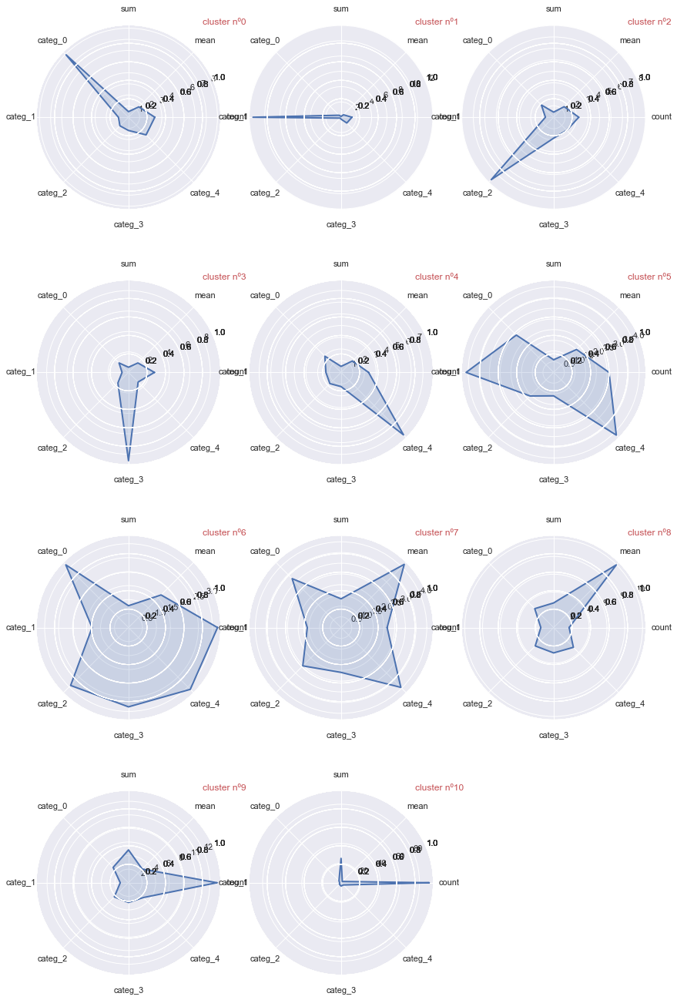

In [67]:
fig=plt.figure(figsize=(10,12))

attributes=['count', 'mean', 'sum', 'categ_0', 'categ_1', 'categ_2', 'categ_3', 'categ_4']
ranges=[[0.01, 10], [0.01, 1500], [0.01, 10000], [0.01, 75], [0.01, 75], [0.01, 75], [0.01, 75], [0.01, 75]]
index =[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12]

n_groups=n_clusters ; i_cols=3
i_rows=n_groups//i_cols
size_x, size_y=(1/i_cols), (1/i_rows)

for ind in range(n_clusters):
    ix=ind%3 ; iy=i_rows - ind//3
    pos_x=ix*(size_x + 0.05)
    pos_y=iy*(size_y + 0.05)            
    location=[pos_x, pos_y]
    sizes=[size_x, size_y] 
    
    data=np.array(merged_df.loc[index[ind], attributes])    
    radar=RadarChart(fig, location, sizes, attributes, ranges)
    radar.plot(data, color='b', linewidth=2.0)
    radar.fill(data, alpha=0.2, color='b')
    radar.title(title='cluster nº{}'.format(index[ind]), color='r')
    ind += 1 

It can be seen, for example, that the first 5 clusters correspond to a strong preponderance of purchases in a particular category of products. Other clusters will differ from basket averages (mean), the total sum spent by the clients (sum) or the total number of visits made (count).

Let's also look at clusters by product category only (remove sum, mean, etc) using interactive radar charts.

In [68]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

row_col_pair=[]
for i in range(1,5):
    for j in range (1,4):
        row_col_pair.append((i,j))

fig=make_subplots(rows=4, cols=3,
  specs=[[{"type": "scatterpolar"}]*3]*4,
  subplot_titles=[f'Cluster {i}' for i in range(11)])

categs=['categ_0', 'categ_1', 'categ_2', 'categ_3', 'categ_4']

for i in range(11):
  row, col=row_col_pair[i]
  fig.add_trace(go.Scatterpolar(
    theta=categs,
    r=merged_df[categs].iloc[i, :].values,
    fill='toself'),
    row=row, col=col
  )


fig.update_layout(
  polar=dict(
    radialaxis=dict(
      visible=True
    ),
  ),
  showlegend=False,
  height=1200, width=1000,
  title_text="Product categories by customer clusters"
)



We can see that after Cluster 5 there is no that much of a difference.

# Customer Classification

## Model Selection

This is the (almost) final part of the project. Here several ML algorithms will be tested for customer classification into previously defined clusters.

In [69]:
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split

Now I select columns that I consider valuable for classification and leaving out the others.

In [70]:
columns=['count', 'mean', 'categ_0', 'categ_1', 'categ_2', 'categ_3', 'categ_4' ]
X, y= selected_customers[columns], selected_customers['cluster']

In [71]:
X_train, X_test, y_train, y_test=train_test_split(X, y, train_size=0.8)
print(X_train.shape, X_test.shape, y_train.shape, y_test.shape)

(2812, 7) (703, 7) (2812,) (703,)


In [115]:
models={'Logistic Regressiom':LogisticRegression(),
        'Random Forest':RandomForestClassifier(),
        'Gradient Boosted': GradientBoostingClassifier(),
        'KNN':KNeighborsClassifier(n_neighbors=5),
        'SVM': SVC()}

res=dict()

for model_name, alg in models.items():
        model=alg.fit(X_train, y_train)
        y_pred=model.predict(X_test)
        res[model_name]=accuracy_score(y_test, y_pred)

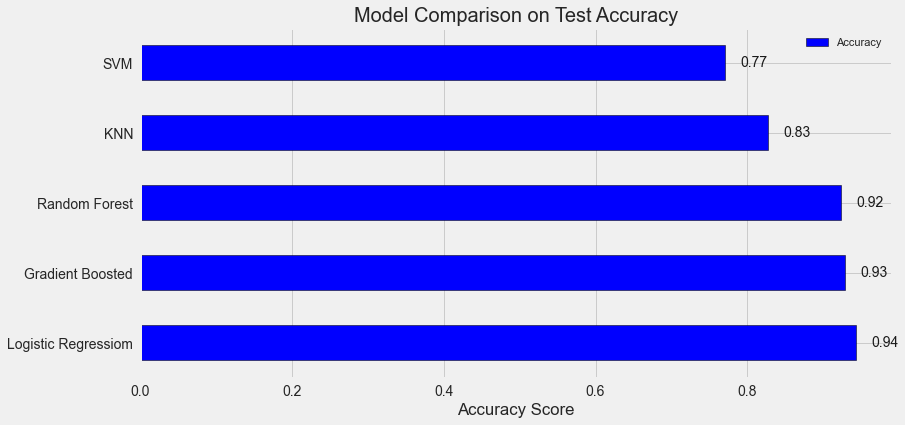

In [116]:
res_df=pd.DataFrame({'Model':list(res.keys()),
                    'Accuracy': list(res.values())})

res_df.sort_values(by='Accuracy', ascending=False).plot(x='Model', y='Accuracy', kind='barh',
                                    color='blue', edgecolor='black',
                                    figsize=(12,6))

for i, v in enumerate(sorted(list(res.values()))[::-1]):
    plt.text(v+0.02, i-.05, f'{v:.2f}', color='k')

plt.ylabel('')
plt.yticks(size=14)
plt.xlabel('Accuracy Score')
plt.xticks(size=14)
plt.title('Model Comparison on Test Accuracy', size=20);

Gradient Boosted Classifier showed best result after Logistic Regression (Which is surprising, because LR is much simpler algorithm). Nonetheless, let's use boosted model. But it must be tuned first. Also I'll use not sklearn's `GradientBoostingClassifier`, but `XGBClassifier` from `xgboost` library. They are basically the same, but the latter is faster.

## Model Tunung

Model optimization (finding best hyperparameters) will be done using Bayesian Optimization with Cross Validation. Unlike Grid or Random searches, Bayesian Optimization uses the past model information to select hyperparameter values to build the newer model.

In [74]:
from skopt import BayesSearchCV
from skopt.space import Real, Categorical, Integer

search_spaces={'learning_rate': Real(0.01, 1.0, 'uniform'),
                'max_depth': Integer(2, 12),
                'subsample': Real(0.1, 1.0, 'uniform'),
                'colsample_bytree': Real(0.1, 1.0, 'uniform'), # subsample ratio of columns by tree
                'reg_lambda': Real(1e-9, 100., 'uniform'), # L2 regularization
                'reg_alpha': Real(1e-9, 100., 'uniform'), # L1 regularization
                'n_estimators': Integer(50, 5000)}

In [75]:
import xgboost

xgb_clf=xgboost.XGBClassifier()

In [76]:
opt=BayesSearchCV(estimator=xgb_clf,
                search_spaces=search_spaces,
                scoring='accuracy',
                n_iter=50,
                cv=5,
                n_jobs=-1,
                verbose=2)

In [77]:
opt.fit(X_train, y_train)

Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fi

BayesSearchCV(cv=5,
              estimator=XGBClassifier(base_score=None, booster=None,
                                      callbacks=None, colsample_bylevel=None,
                                      colsample_bynode=None,
                                      colsample_bytree=None,
                                      early_stopping_rounds=None,
                                      enable_categorical=False,
                                      eval_metric=None, gamma=None, gpu_id=None,
                                      grow_policy=None, importance_type=None,
                                      interaction_constraints=None,
                                      learning_rate=None, max_bin=None,
                                      max_c...
                             'max_depth': Integer(low=2, high=12, prior='uniform', transform='normalize'),
                             'n_estimators': Integer(low=50, high=5000, prior='uniform', transform='normalize'),
                             'reg_alpha': Real(low=1e-09, high=100.0, prior='uniform', transform='normalize'),
                             'reg_lambda': Real(low=1e-09, high=100.0, prior='uniform', transform='normalize'),
                             'subsample': Real(low=0.1, high=1.0, prior='uniform', transform='normalize')},
              verbose=2)

In [86]:
best_xgb=opt.best_estimator_
best_xgb

XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1,
              colsample_bytree=0.9803844937814057, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, gamma=0, gpu_id=-1,
              grow_policy='depthwise', importance_type=None,
              interaction_constraints='', learning_rate=1.0, max_bin=256,
              max_cat_to_onehot=4, max_delta_step=0, max_depth=12, max_leaves=0,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=1143, n_jobs=0, num_parallel_tree=1,
              objective='multi:softprob', predictor='auto', random_state=0,
              reg_alpha=0.011464565043785308, ...)

In [91]:
joblib.dump(best_xgb, '../models/best_xgb.sav')

['../models/best_xgb.sav']

Now let's test tuned classifier on test set and compare it to base XGBRFClassifier.

In [88]:
base_xgb=xgboost.XGBRFClassifier()

base_xgb.fit(X_train, y_train)

base_pred=base_xgb.predict(X_test)
best_pred=best_xgb.predict(X_test)

print(f'Base Classifier Accuracy: {accuracy_score(y_test, base_pred)}')
print(f'Best Classifier Accuracy: {accuracy_score(y_test, best_pred)}')

Base Classifier Accuracy: 0.9118065433854907
Best Classifier Accuracy: 0.9402560455192034


There is a significant boost in accuracy. But accuracy is not the only metric you should look at. Let's also take a look at classification reports and confusion matrices.

In [104]:
from sklearn.metrics import classification_report

preds=[('Base XGBoost', base_pred), ('Best XGBoost', best_pred)]

for n, clf in preds:
    print(n)
    print(classification_report(y_test, clf, 
                    target_names=[f'cluster {i}' for i in range(11)]))

Base XGBoost
              precision    recall  f1-score   support

   cluster 0       0.98      0.98      0.98        84
   cluster 1       0.93      0.89      0.91        56
   cluster 2       0.89      0.94      0.92       212
   cluster 3       0.89      0.90      0.90        71
   cluster 4       0.89      0.89      0.89         9
   cluster 5       0.92      0.84      0.88        86
   cluster 6       1.00      0.92      0.96        63
   cluster 7       0.95      1.00      0.98        62
   cluster 8       0.92      1.00      0.96        12
   cluster 9       0.75      0.72      0.73        46
  cluster 10       0.00      0.00      0.00         2

    accuracy                           0.91       703
   macro avg       0.83      0.83      0.83       703
weighted avg       0.91      0.91      0.91       703

Best XGBoost
              precision    recall  f1-score   support

   cluster 0       0.99      0.98      0.98        84
   cluster 1       0.96      0.95      0.95        5

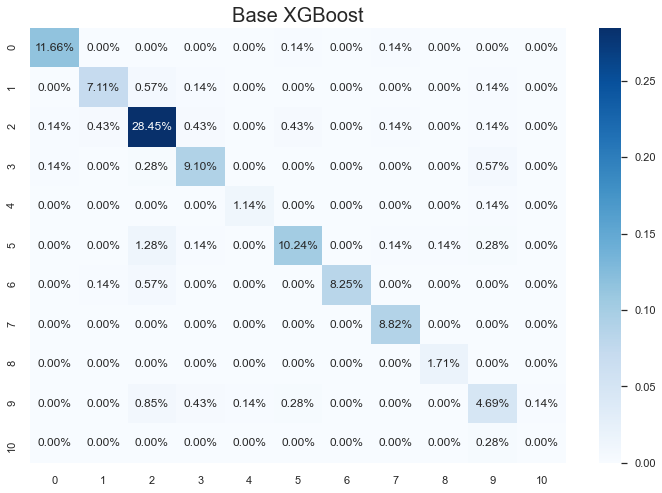

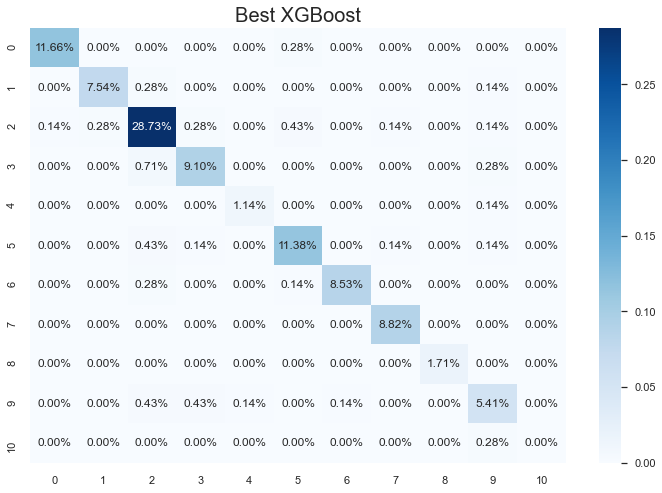

In [105]:
from sklearn.metrics import confusion_matrix

for n, clf in preds:
    plt.figure(figsize=(12,8))
    base_conf_mat=confusion_matrix(y_test, clf)
    sns.heatmap(base_conf_mat/np.sum(base_conf_mat), annot=True, 
                fmt='.2%', cmap='Blues')
    plt.title(n, fontsize=20);

# Result Interpretation 

## Feature Importance

In this part of the project I'll try to make the model more interpretable, as if I explain it to someone with no knowledge/experience in Data Science.  

In [108]:
feat_res=pd.DataFrame({'feature': X.columns,
                        'importance':best_xgb.feature_importances_})\
                            .sort_values(by='importance', ascending=False).reset_index(drop=True)
feat_res.head()

,feature,importance
0,mean,0.159994
1,categ_3,0.146922
2,categ_1,0.144251
3,categ_4,0.140859
4,count,0.140325


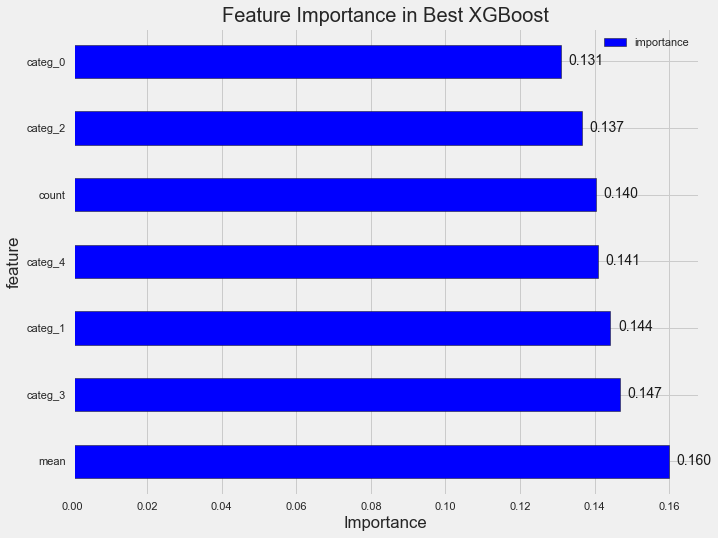

In [119]:
feat_res.plot(kind='barh', x='feature', y='importance', color='blue', 
                edgecolor='k', figsize=(10, 8))

plt.xlabel('Importance')
plt.title('Feature Importance in Best XGBoost', size=20)

for i, v in enumerate(feat_res.iloc[:9, 1]):
    plt.text(v+0.002, i-0.05, f'{v:.3f}', color='k')

As there are only seven pretty similar features in the dataset, their importances are quite close.

## Visualize a Single Decision Tree

As we deal with a tree-based algorithm, it's also possible to visualize a single decision tree from an ensemble.

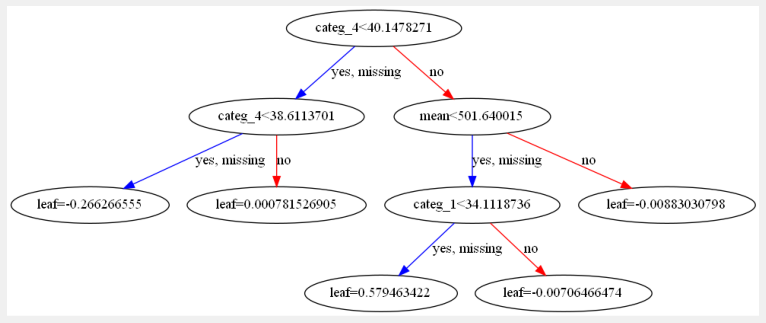

In [127]:
from xgboost import plot_tree

fig, ax=plt.subplots(figsize=(12,8))

plot_tree(best_xgb, ax=ax);

`plot_tree` visualises one of all trees used in XBGoost model (here the first one is visualized). The advantage of decision trees is that they are pretty self-explanatory.

That's all! It was a lot of code to do the segmentation. But it's not over yet. Models from this notebook will be used to deploy a Web App. Also, there will be a second notebook with RFM Analysis performed on the same dataset.